In [2]:
!pip install -U pandas numpy scipy matplotlib plotly statsmodels pmdarima scikit-learn seaborn tqdm joblib statsmodels


Defaulting to user installation because normal site-packages is not writeable


In [19]:
%matplotlib inline
import plotly.io as pio
pio.renderers.default = "notebook"   # if in JupyterLab, use "iframe_connected"


In [2]:
!pip install "numpy<2" --force-reinstall


Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 15.8/15.8 MB 2.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\ch.en.u4aie22004\\AppData\\Roaming\\Python\\Python310\\site-packages\\~umpy.libs\\libscipy_openblas64_-13e2df515630b4a41f92893938845698.dll'
Check the permissions.



In [6]:
# Install dependencies (only once per environment)
#!pip install -U pandas numpy scipy matplotlib plotly statsmodels pmdarima scikit-learn seaborn tqdm joblib

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from tqdm import tqdm

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error


In [8]:
# Replace file path for different sectors
file_path = "C:/Users/ch.en.u4aie22004/Downloads/archive (1)/NIFTY 50_cleaned.csv"

df = pd.read_csv(file_path, parse_dates=["Date"], index_col="Date")
df = df.sort_index()
df.head()


,Index Name,Close
Date,,
2007-01-02,NIFTY 50,4007.40
2007-01-03,NIFTY 50,4024.05
2007-01-04,NIFTY 50,3988.80
2007-01-05,NIFTY 50,3983.40
2007-01-08,NIFTY 50,3933.40


In [9]:
# Augmented Dickey-Fuller Test
result = adfuller(df['Close'])
print("ADF Statistic:", result[0])
print("p-value:", result[1])


ADF Statistic: 1.1288388452453535
p-value: 0.9954553885734453


In [10]:
# Auto ARIMA to find best order
auto_model = pm.auto_arima(df['Close'], seasonal=False, stepwise=True, suppress_warnings=True)
print("Best ARIMA order:", auto_model.order)

# Fit final ARIMA
model = ARIMA(df['Close'], order=auto_model.order)
fitted = model.fit()
print(fitted.summary())


Best ARIMA order: (0, 1, 0)
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 4604
Model:                 ARIMA(0, 1, 0)   Log Likelihood              -28431.107
Date:                Tue, 09 Sep 2025   AIC                          56864.215
Time:                        10:48:26   BIC                          56870.649
Sample:                             0   HQIC                         56866.479
                               - 4604                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.356e+04    105.280    128.840      0.000    1.34e+04    1.38e+04
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             30629.99
Prob(Q):           

In [11]:
def backtest_arima(series, order, train_size=0.8):
    n_train = int(len(series) * train_size)
    train, test = series[:n_train], series[n_train:]

    history = list(train)
    predictions = []

    for t in tqdm(range(len(test))):
        model = ARIMA(history, order=order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    return test, predictions

test, preds = backtest_arima(df['Close'], auto_model.order)

# Performance Metrics
mae = mean_absolute_error(test, preds)
mse = mean_squared_error(test, preds)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(test, preds)

print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2%}")


100%|████████████████████████████████████████████████████████████████████████████████| 921/921 [00:21<00:00, 42.19it/s]

MAE: 130.30, RMSE: 179.68, MAPE: 0.65%


In [20]:
forecast_steps = 30
forecast = fitted.get_forecast(steps=forecast_steps)
forecast_ci = forecast.conf_int()

fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index, y=df['Close'], 
                         mode="lines", name="Actual", line=dict(color="blue")))

fig.add_trace(go.Scatter(x=pd.date_range(df.index[-1], periods=forecast_steps+1, freq="B")[1:], 
                         y=forecast.predicted_mean, mode="lines", 
                         name="Forecast", line=dict(color="red")))

fig.add_trace(go.Scatter(
    x=pd.date_range(df.index[-1], periods=forecast_steps+1, freq="B")[1:].tolist() + 
      pd.date_range(df.index[-1], periods=forecast_steps+1, freq="B")[1:].tolist()[::-1],
    y=forecast_ci.iloc[:, 0].tolist() + forecast_ci.iloc[:, 1].tolist()[::-1],
    fill="toself", fillcolor="rgba(255, 0, 0, 0.2)", 
    line=dict(color="rgba(255,255,255,0)"), 
    name="Confidence Interval"
))

fig.update_layout(title="Forecast with Confidence Interval",
                  xaxis_title="Date",
                  yaxis_title="Index Value",
                  template="plotly_dark",
                  height=600)
fig.show(renderer="notebook")


In [21]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index, y=df['Close'], name="Actual", line=dict(color="blue")))
fig.add_trace(go.Scatter(x=test.index, y=preds, name="Backtest Predictions", line=dict(color="red")))

fig.update_layout(title="Backtesting: Actual vs Predicted",
                  xaxis_title="Date",
                  yaxis_title="Index Value",
                  template="plotly_dark",
                  height=600)
fig.show(renderer="notebook")


In [18]:
error_metrics = pd.DataFrame({
    "MAE": [mae],
    "RMSE": [rmse],
    "MAPE (%)": [mape*100]
})
error_metrics


,MAE,RMSE,MAPE (%)
0,130.295223,179.676485,0.65


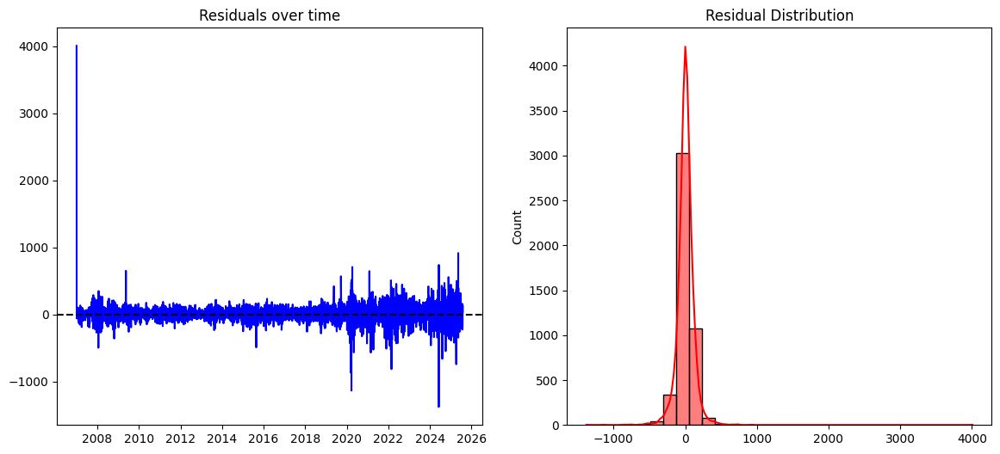

In [22]:
residuals = fitted.resid

plt.figure(figsize=(14,6))

plt.subplot(1,2,1)
plt.plot(residuals, color="blue")
plt.title("Residuals over time")
plt.axhline(0, linestyle="--", color="black")

plt.subplot(1,2,2)
sns.histplot(residuals, kde=True, bins=30, color="red")
plt.title("Residual Distribution")

plt.show()


In [26]:
# 📌 Block C (Updated): Walk-Forward Backtesting from START

order = (1,1,1)   # ARIMA order (can tune later)

predictions = []
actuals = []
dates = []

# Start with just the very first observation, expand one by one
for t in tqdm(range(1, len(ts))):  
    train = ts[:t]               # data up to time t-1
    test = ts[t]                 # actual at time t
    
    try:
        model = ARIMA(train, order=order)
        model_fit = model.fit()
        forecast = model_fit.forecast()[0]
    except:
        forecast = train.iloc[-1]   # fallback: persistence (last value)
    
    predictions.append(forecast)
    actuals.append(test)
    dates.append(ts.index[t])

# Align as Pandas Series
pred_series = pd.Series(predictions, index=dates)
actual_series = pd.Series(actuals, index=dates)


NameError: name 'ts' is not defined

In [24]:
# Use best ARIMA order from AutoARIMA
order = auto_model.order
test, preds, metrics = backtest_arima_full(df['Close'], order)


100%|██████████████████████████████████████████████████████████████████████████████| 1842/1842 [00:38<00:00, 47.80it/s]

MAE: 112.90, RMSE: 160.50, MAPE: 0.73%


In [25]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index, y=df['Close'], name="Actual", line=dict(color="blue")))
fig.add_trace(go.Scatter(x=test.index, y=preds, name="Predicted (Walk-Forward)", line=dict(color="red")))

fig.update_layout(title="Walk-Forward Backtesting: Actual vs Predicted",
                  xaxis_title="Date", yaxis_title="Index Value",
                  template="plotly_dark", height=600)
fig.show()


# **Test-2**

In [27]:
# 📌 Block A: Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
from tqdm import tqdm
import pmdarima as pm
import glob
import os

plt.style.use("seaborn-v0_8")
sns.set_palette("viridis")


In [28]:
# 📌 Block B: Define Backtesting Function

def backtest_arima(filepath):
    print(f"\n📂 Processing: {os.path.basename(filepath)}")

    # Load dataset
    df = pd.read_csv(filepath)
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    ts = df['Close']

    # Auto-tune ARIMA order
    print("🔍 Auto-tuning ARIMA order...")
    auto_model = pm.auto_arima(ts,
                               seasonal=False,
                               stepwise=True,
                               suppress_warnings=True,
                               error_action="ignore")
    order = auto_model.order
    print(f"✅ Selected ARIMA order: {order}")

    # Walk-forward backtesting
    predictions, actuals, dates = [], [], []
    for t in tqdm(range(1, len(ts))):
        train = ts[:t]
        test = ts[t]
        try:
            model = ARIMA(train, order=order)
            model_fit = model.fit()
            forecast = model_fit.forecast()[0]
        except:
            forecast = train.iloc[-1]  # persistence fallback
        predictions.append(forecast)
        actuals.append(test)
        dates.append(ts.index[t])

    pred_series = pd.Series(predictions, index=dates)
    actual_series = pd.Series(actuals, index=dates)

    # 📊 Metrics
    mse = mean_squared_error(actual_series, pred_series)
    rmse = sqrt(mse)
    mae = mean_absolute_error(actual_series, pred_series)
    mape = np.mean(np.abs((actual_series - pred_series) / actual_series)) * 100
    r2 = r2_score(actual_series, pred_series)

    print(f"📈 Metrics for {os.path.basename(filepath)}")
    print(f"   RMSE: {rmse:.4f}")
    print(f"   MAE : {mae:.4f}")
    print(f"   MAPE: {mape:.2f}%")
    print(f"   R²   : {r2:.4f}")

    # 📌 Visualisations
    plt.figure(figsize=(15,6))
    plt.plot(ts, label="Actual", color="blue")
    plt.plot(pred_series, label="Backtest Predictions", color="orange", alpha=0.7)
    plt.title(f"Walk-Forward Backtesting ({os.path.basename(filepath)})")
    plt.xlabel("Date"); plt.ylabel("Index Value"); plt.legend()
    plt.show()

    residuals = actual_series - pred_series
    fig, axes = plt.subplots(1, 2, figsize=(14,5))
    sns.histplot(residuals, bins=30, kde=True, ax=axes[0])
    axes[0].set_title("Residual Distribution")
    axes[1].plot(residuals, label="Residuals", color="red")
    axes[1].axhline(0, linestyle="--", color="black")
    axes[1].set_title("Residuals Over Time")
    plt.show()

    plt.figure(figsize=(12,4))
    plt.plot(np.abs(residuals), label="Absolute Error", color="purple")
    plt.title("Error Over Time")
    plt.xlabel("Date"); plt.ylabel("Absolute Error"); plt.legend()
    plt.show()

    rolling_rmse = np.sqrt((residuals**2).rolling(window=30).mean())
    plt.figure(figsize=(12,4))
    plt.plot(rolling_rmse, label="Rolling 30-day RMSE", color="green")
    plt.title("Rolling RMSE Trend")
    plt.xlabel("Date"); plt.ylabel("RMSE"); plt.legend()
    plt.show()

    return {"file": os.path.basename(filepath),
            "rmse": rmse, "mae": mae, "mape": mape, "r2": r2}



📂 Processing: NIFTY 50_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (0, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [01:19<00:00, 57.58it/s]


📈 Metrics for NIFTY 50_cleaned.csv
   RMSE: 116.4787
   MAE : 77.4173
   MAPE: 0.87%
   R²   : 0.9996


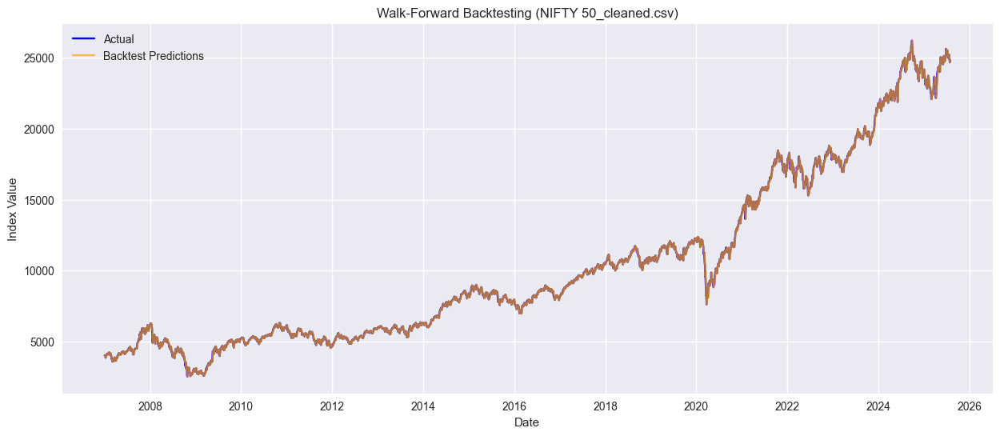

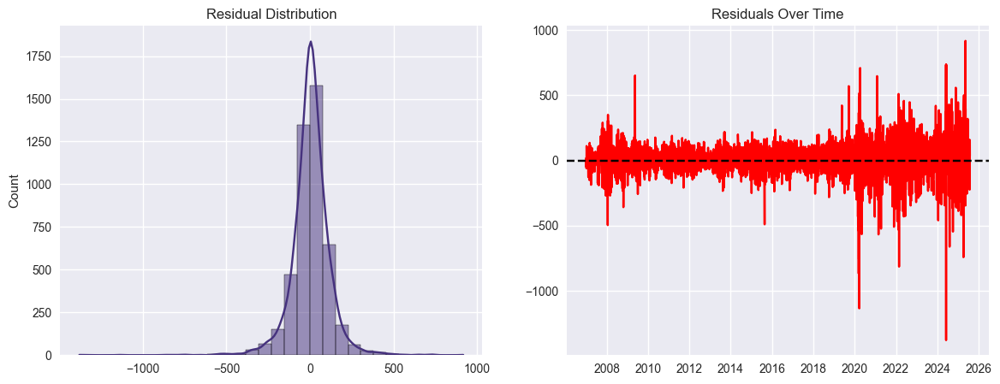

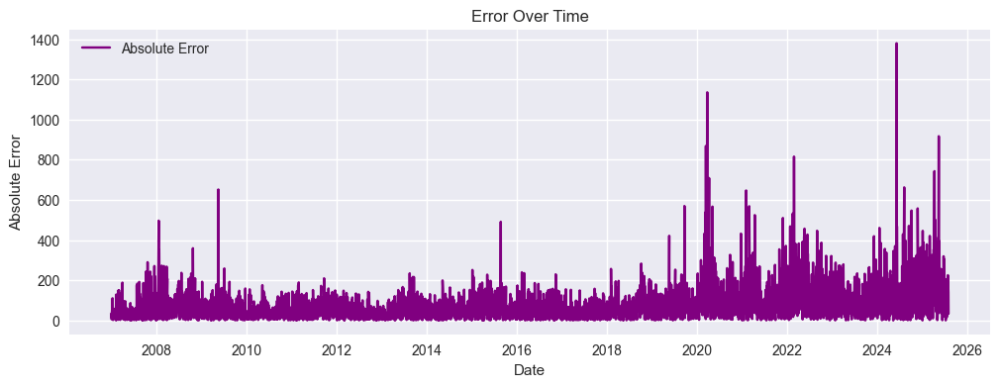

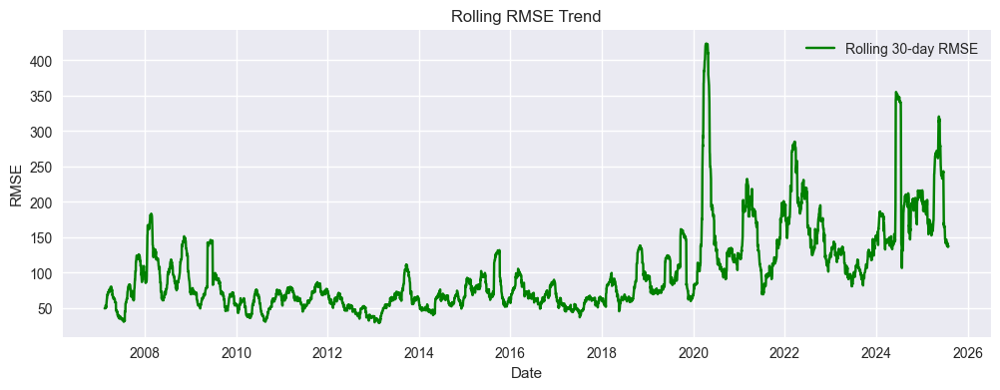


📂 Processing: NIFTY AUTO_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (2, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [03:06<00:00, 24.75it/s]


📈 Metrics for NIFTY AUTO_cleaned.csv
   RMSE: 124.1016
   MAE : 77.9565
   MAPE: 1.02%
   R²   : 0.9995


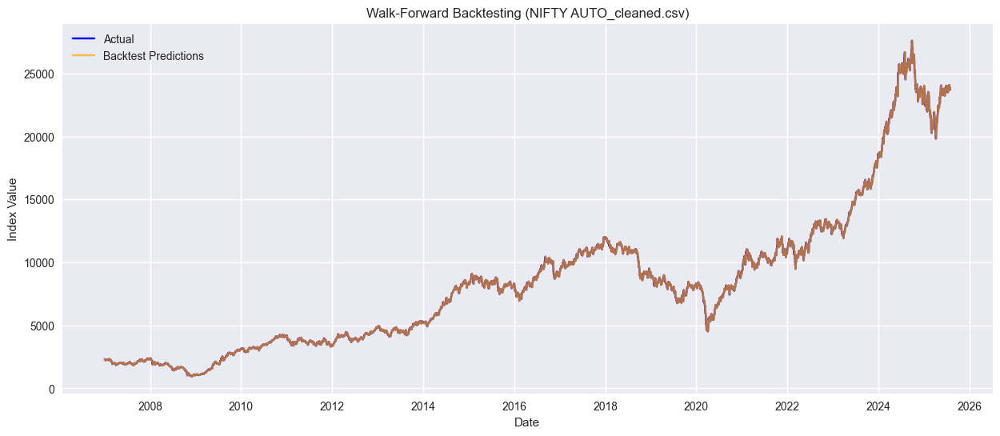

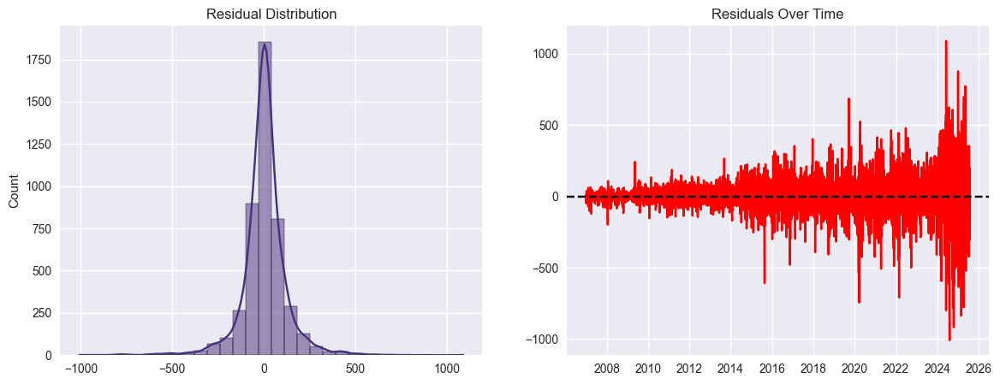

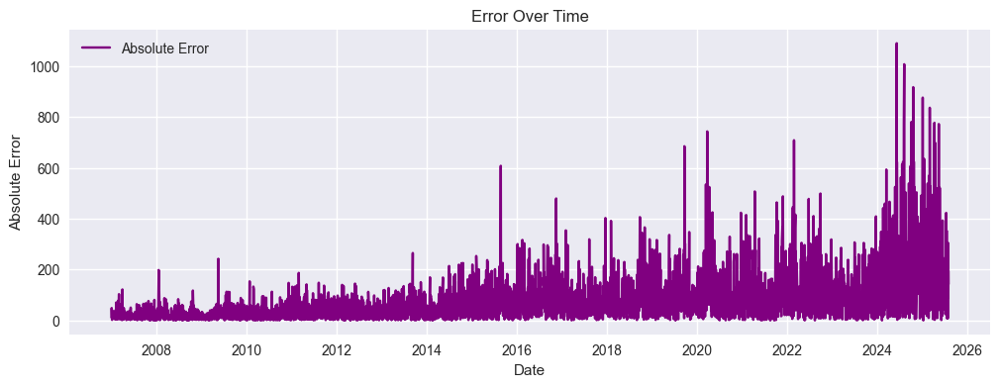

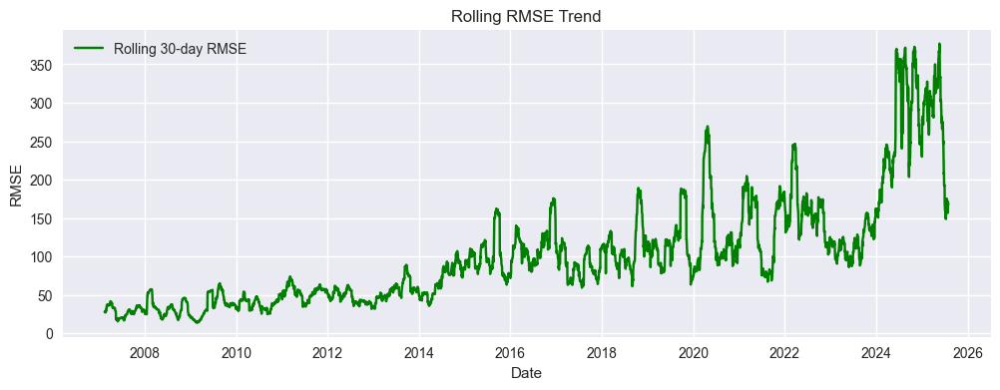


📂 Processing: NIFTY BANK_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (2, 1, 3)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [57:16<00:00,  1.34it/s]


📈 Metrics for NIFTY BANK_cleaned.csv
   RMSE: 327.6157
   MAE : 215.3286
   MAPE: 1.19%
   R²   : 0.9995


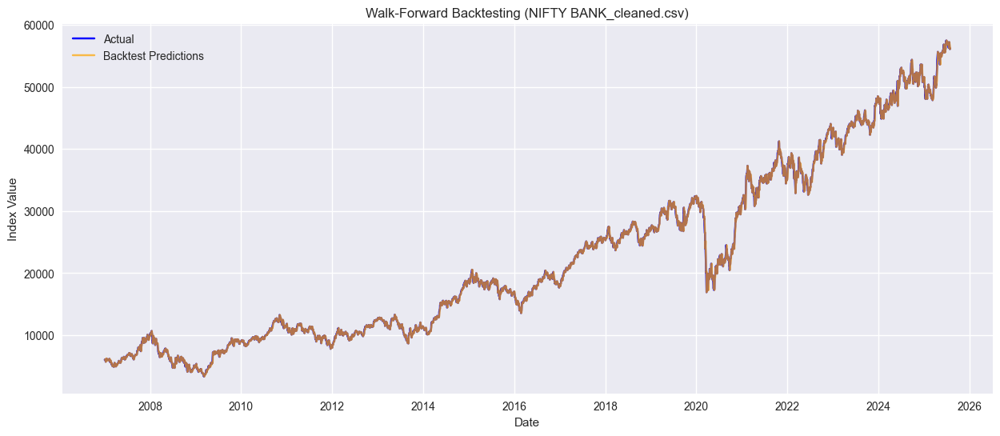

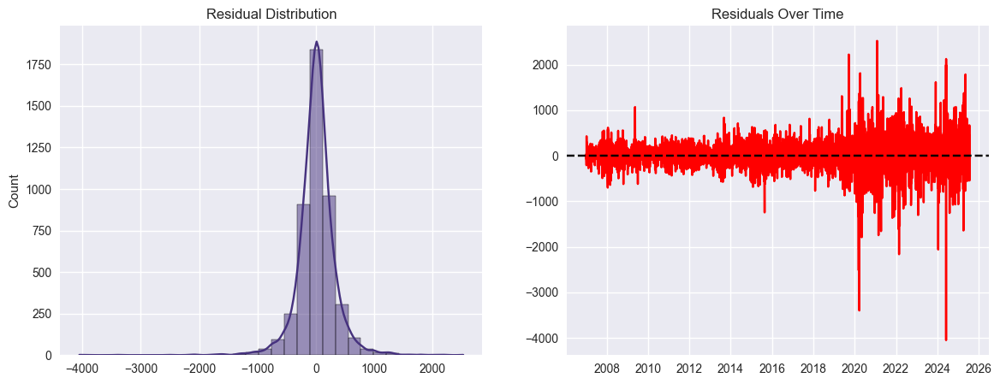

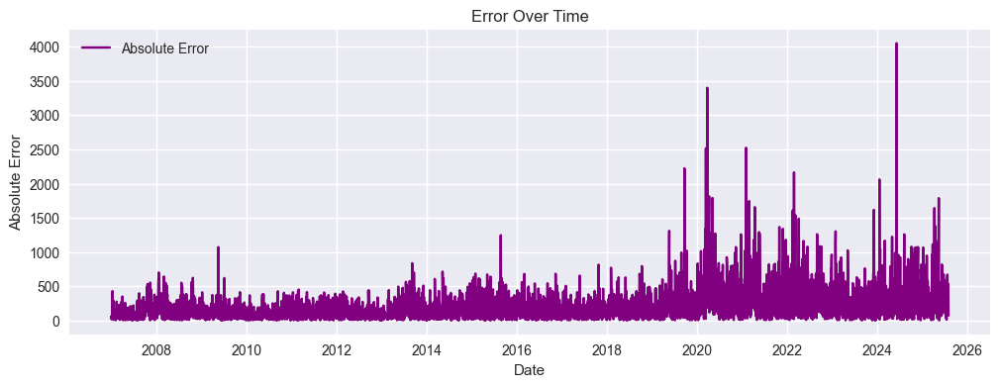

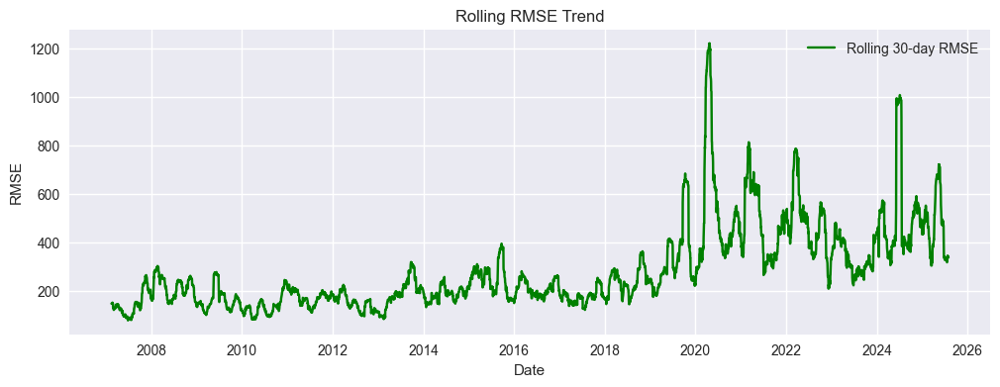


📂 Processing: NIFTY CHEMICALS_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (5, 2, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [10:25<00:00,  7.35it/s]


📈 Metrics for NIFTY CHEMICALS_cleaned.csv
   RMSE: 150.7643
   MAE : 80.9122
   MAPE: 0.96%
   R²   : 0.9997


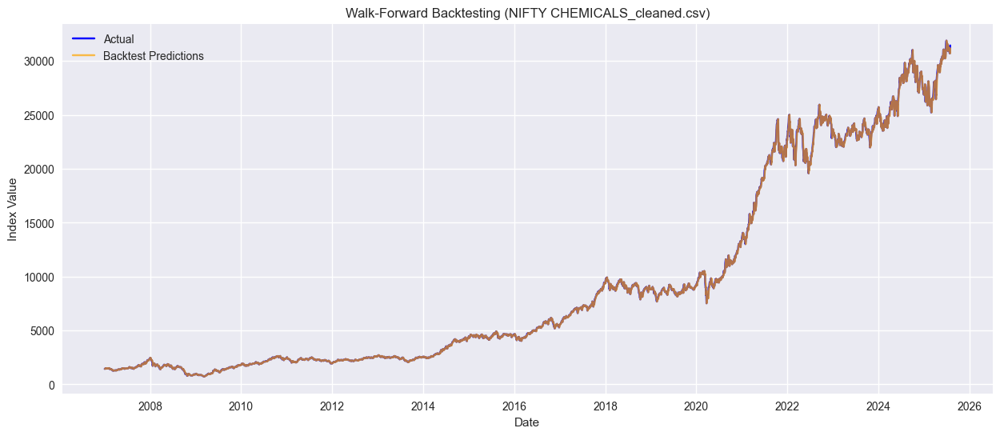

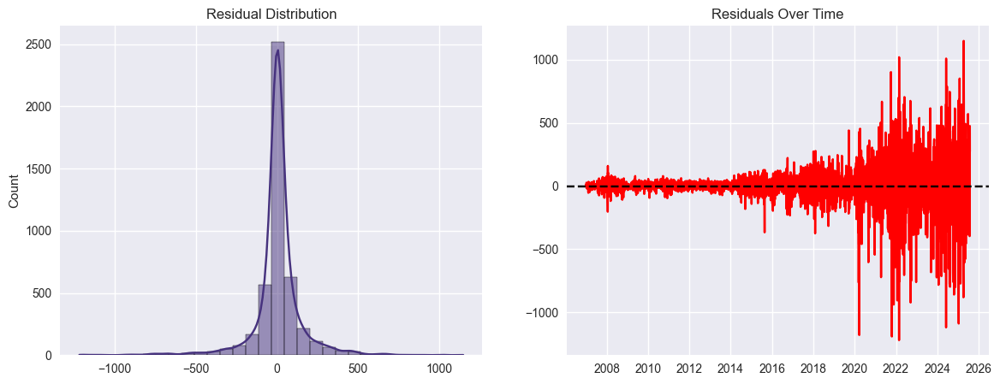

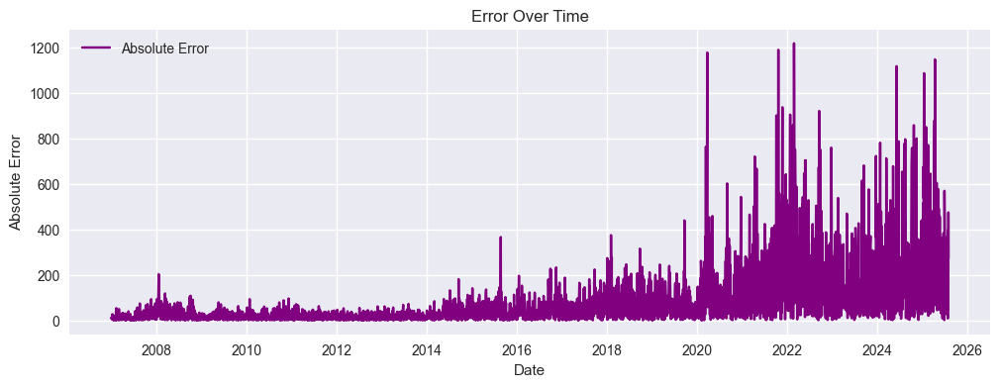

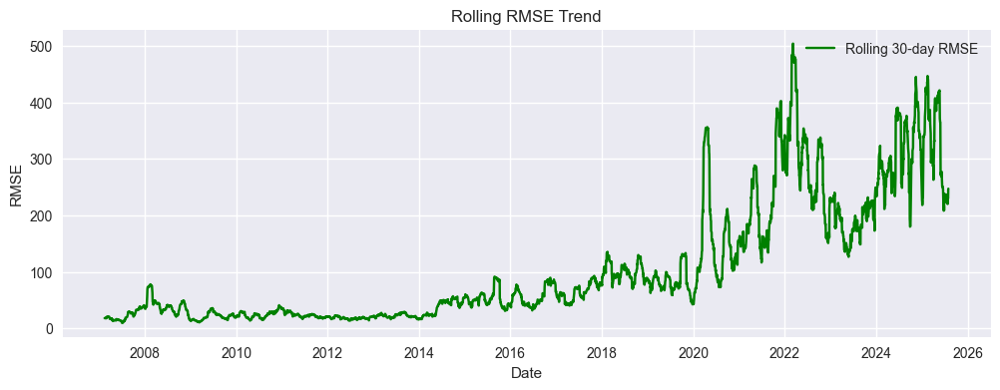


📂 Processing: NIFTY CONSUMER DURABLES_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (3, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [04:03<00:00, 18.92it/s]

📈 Metrics for NIFTY CONSUMER DURABLES_cleaned.csv
   RMSE: 190.9986
   MAE : 109.7393
   MAPE: 1.02%
   R²   : 0.9997


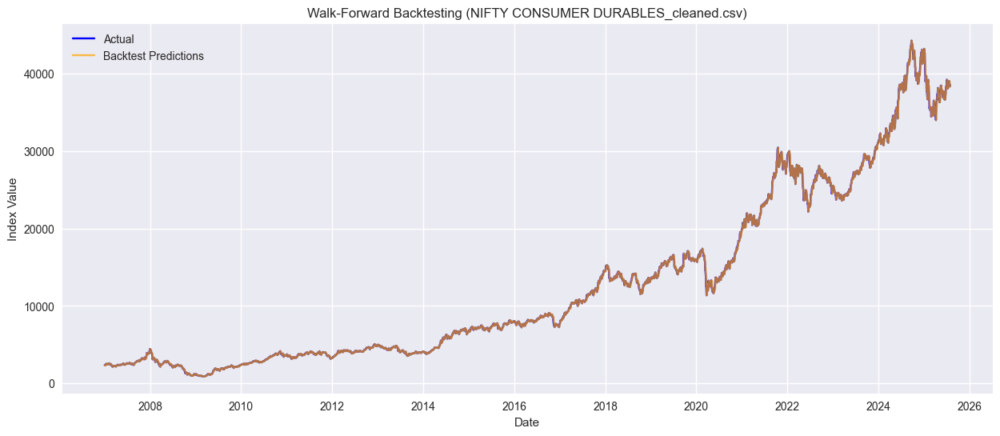

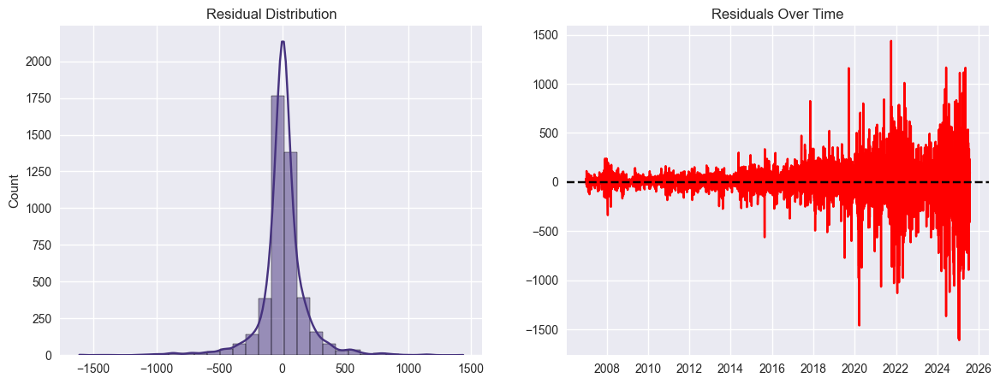

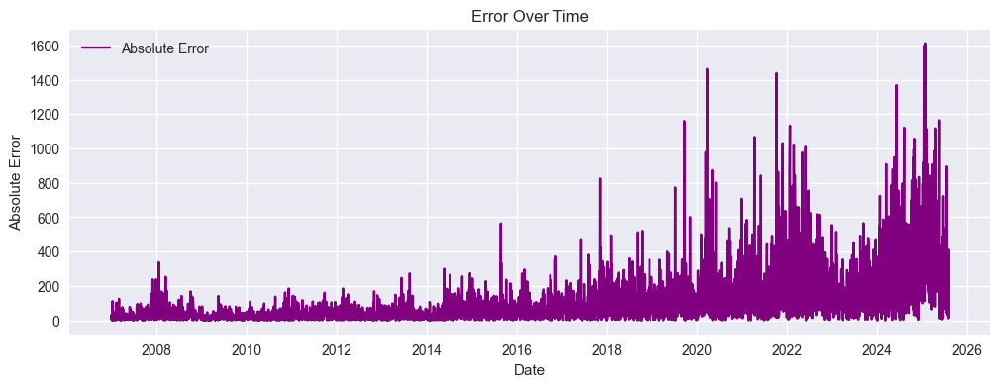

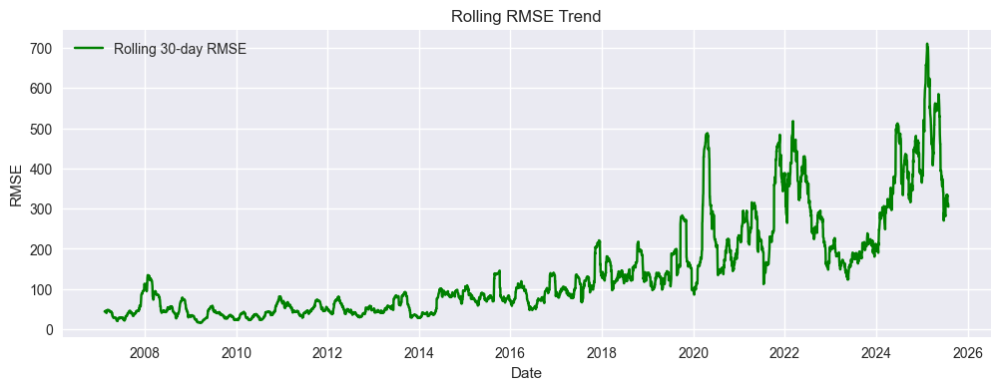


📂 Processing: NIFTY FINANCIAL SERVICES_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (2, 1, 2)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [35:24<00:00,  2.17it/s]

📈 Metrics for NIFTY FINANCIAL SERVICES_cleaned.csv
   RMSE: 144.3952
   MAE : 91.5607
   MAPE: 1.14%
   R²   : 0.9995


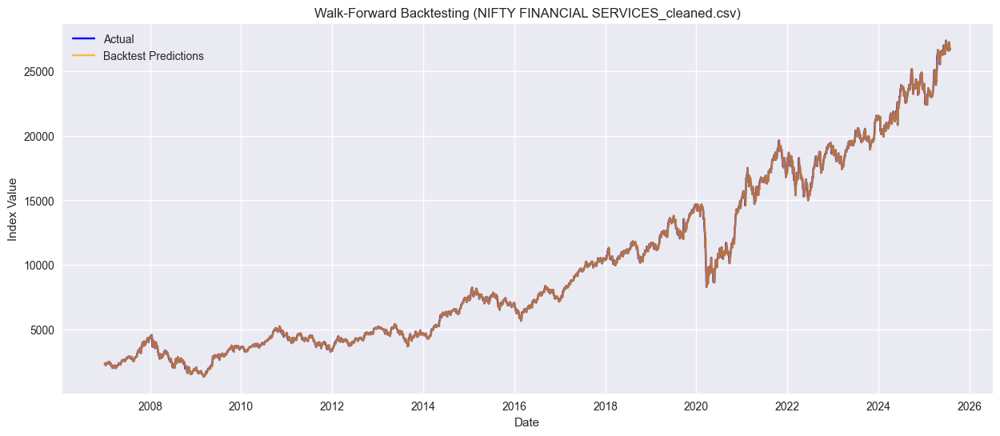

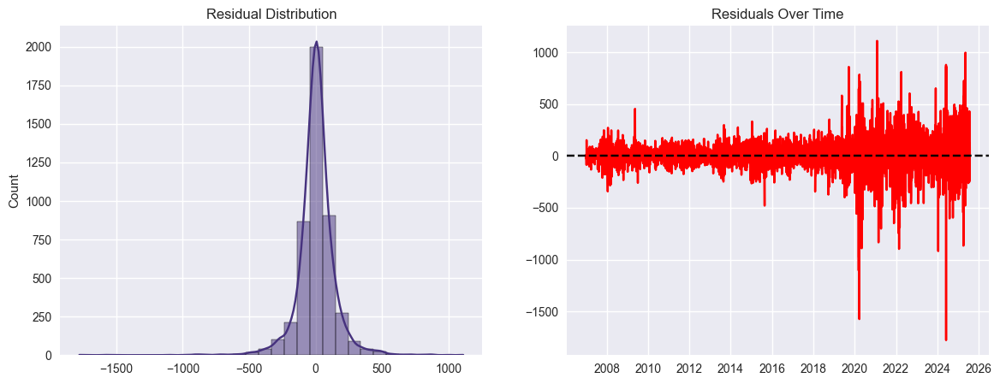

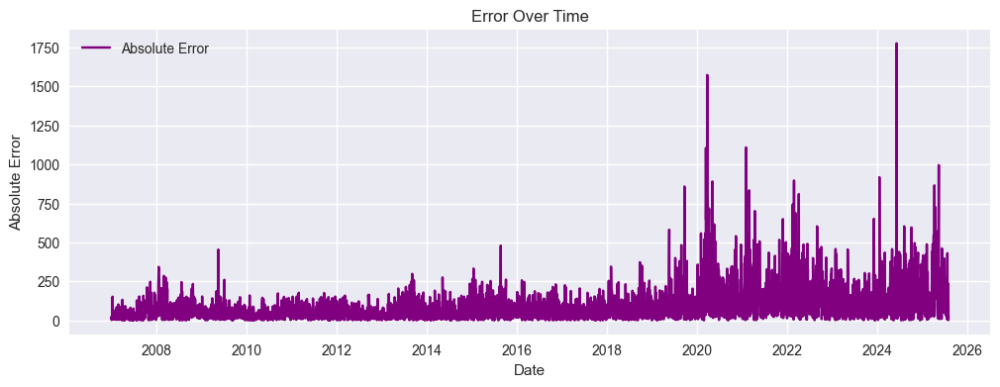

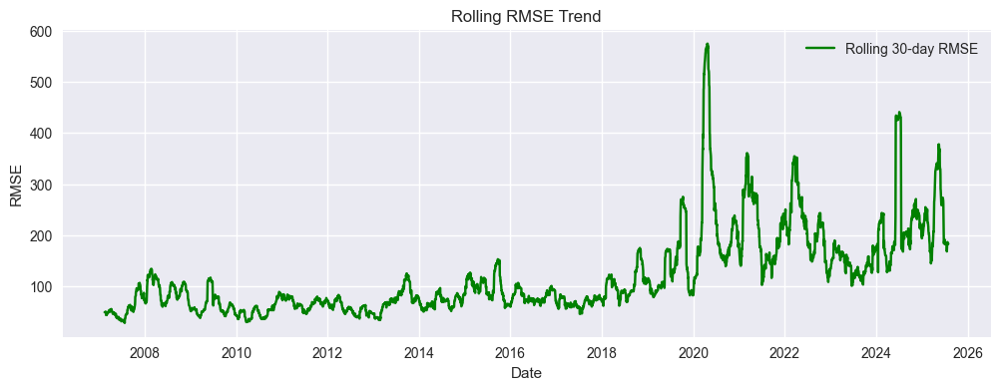


📂 Processing: NIFTY FMCG_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (0, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [01:19<00:00, 58.03it/s]


📈 Metrics for NIFTY FMCG_cleaned.csv
   RMSE: 276.2341
   MAE : 179.0311
   MAPE: 0.82%
   R²   : 0.9997


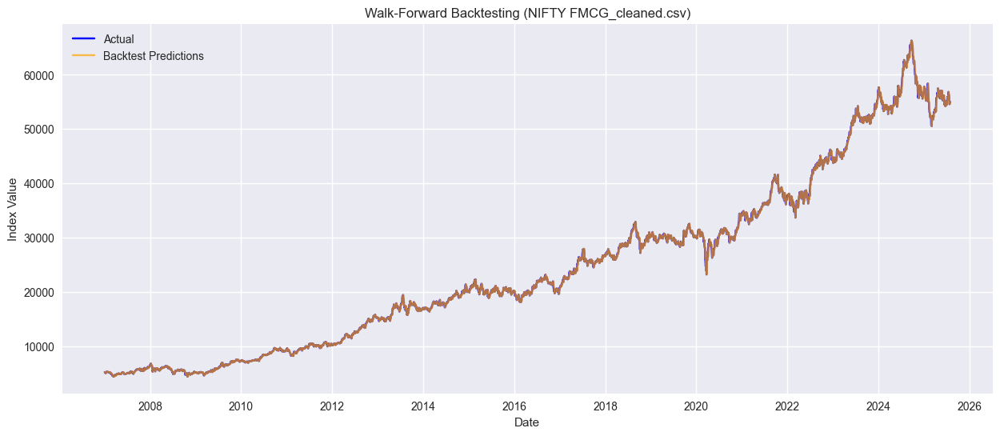

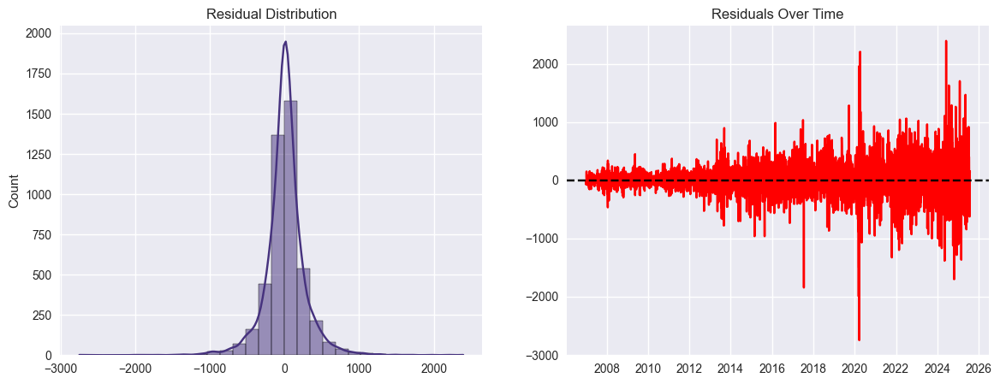

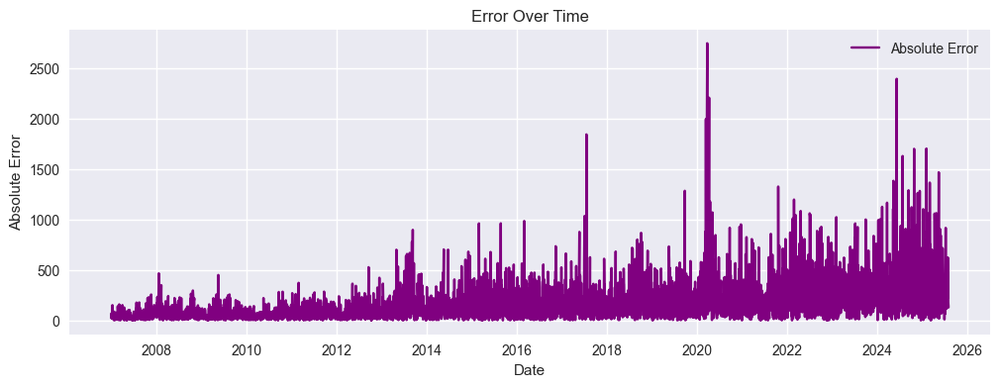

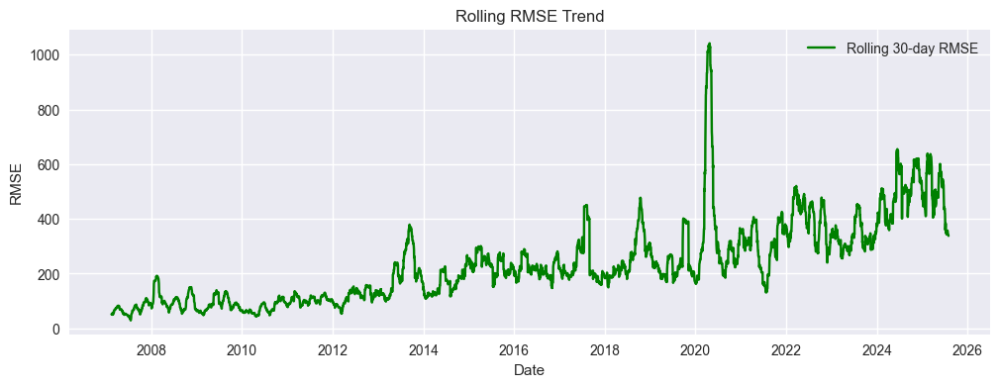


📂 Processing: NIFTY HEALTHCARE_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (1, 2, 1)


100%|██████████████████████████████████████████████████████████████████████████████| 7090/7090 [27:05<00:00,  4.36it/s]


📈 Metrics for NIFTY HEALTHCARE_cleaned.csv
   RMSE: 1115.1829
   MAE : 798.9280
   MAPE: 17.68%
   R²   : 0.8481


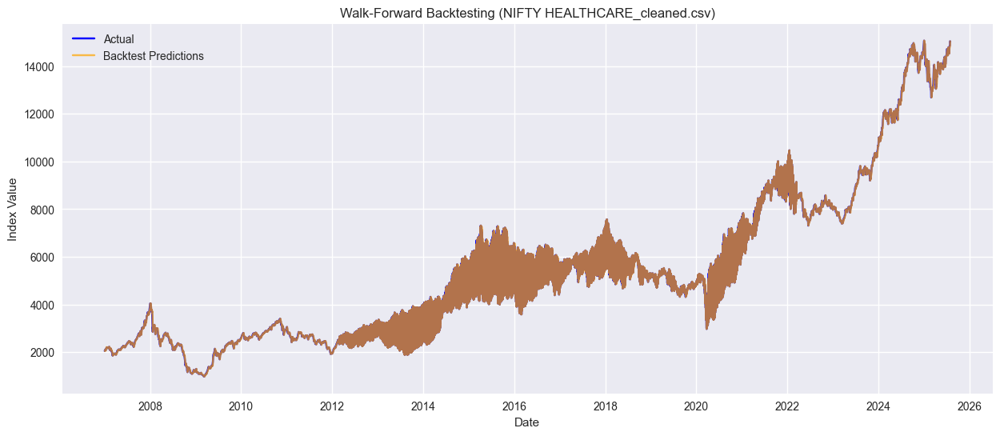

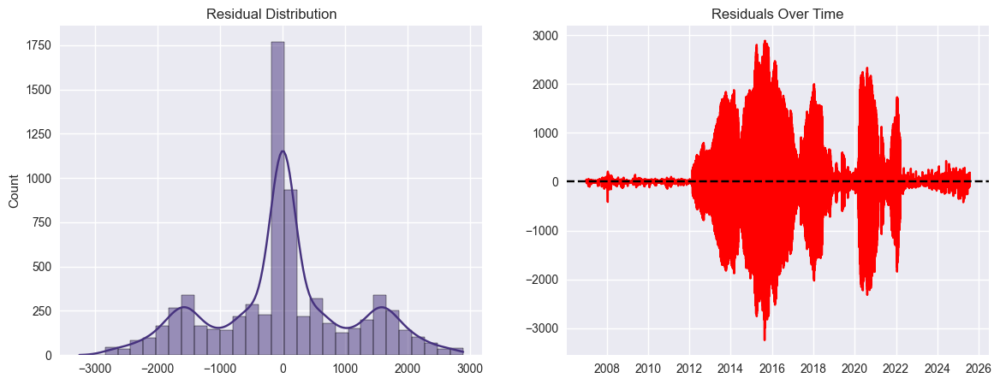

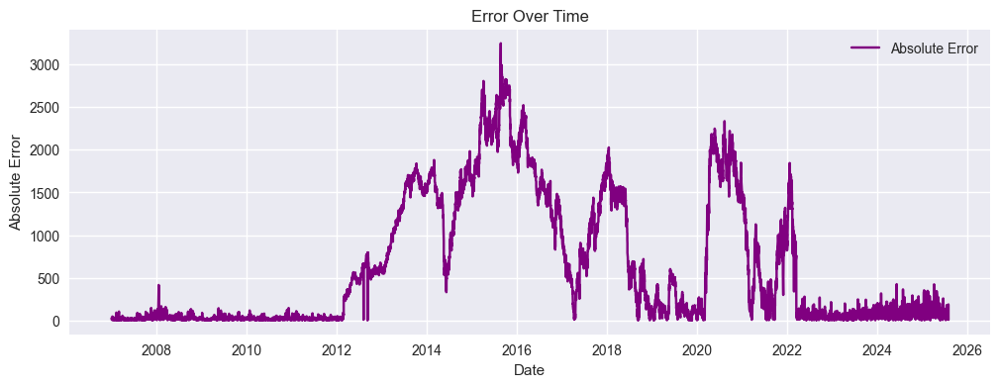

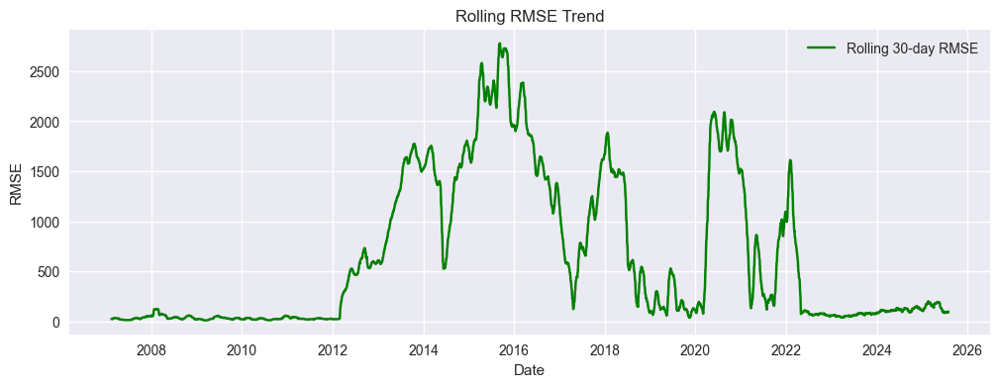


📂 Processing: NIFTY IT_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (1, 1, 1)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [09:26<00:00,  8.13it/s]

📈 Metrics for NIFTY IT_cleaned.csv
   RMSE: 250.8818
   MAE : 148.1101
   MAPE: 1.07%
   R²   : 0.9995


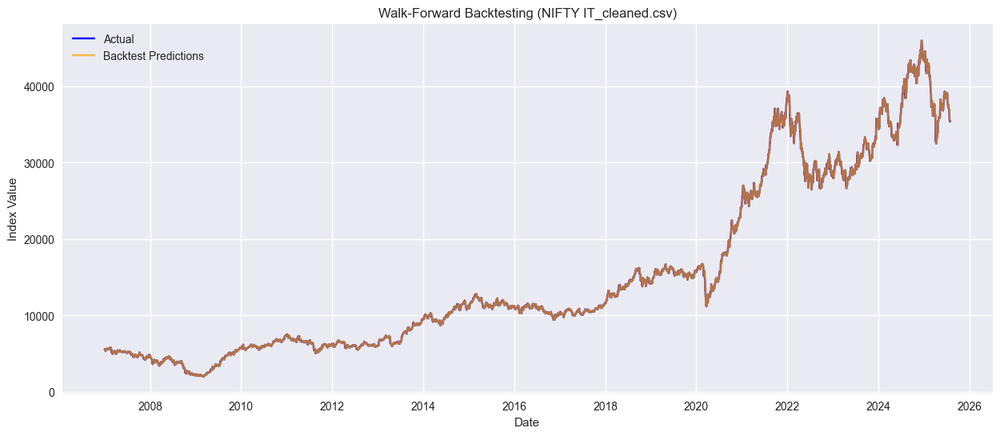

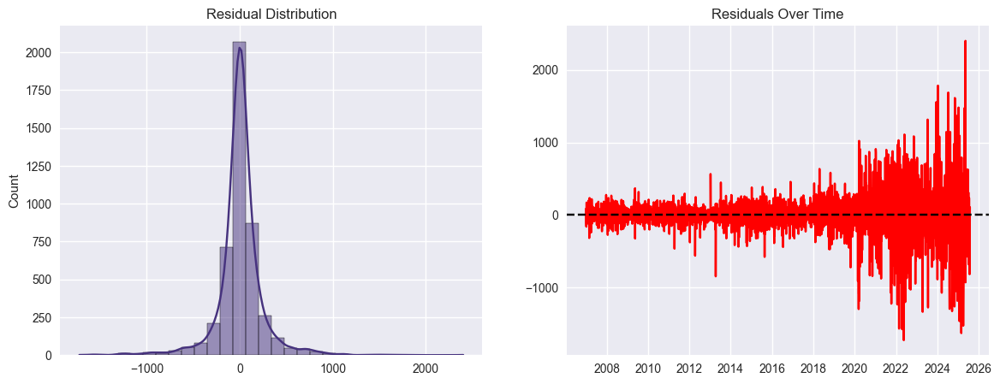

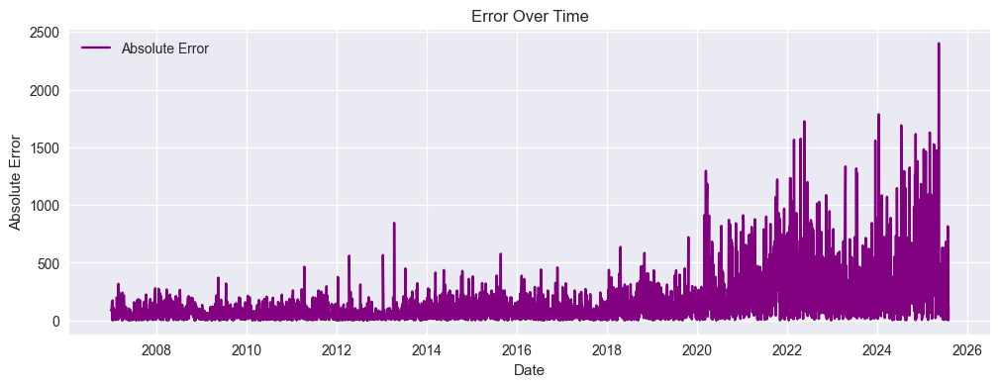

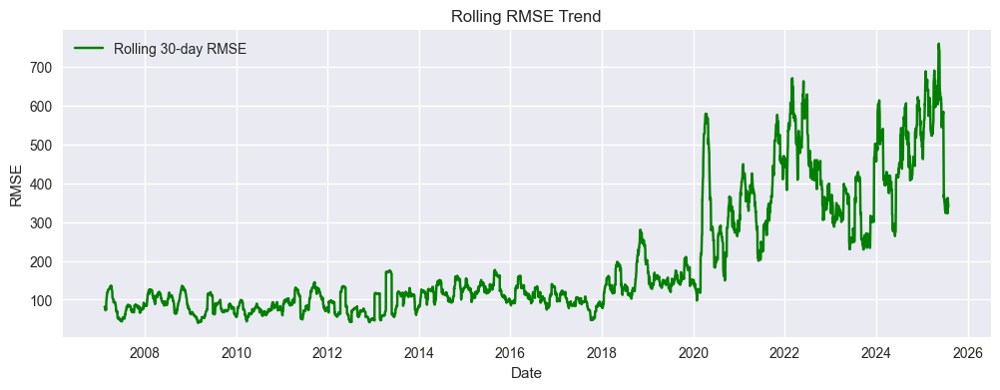


📂 Processing: NIFTY MEDIA_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (0, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [01:31<00:00, 50.56it/s]


📈 Metrics for NIFTY MEDIA_cleaned.csv
   RMSE: 33.0076
   MAE : 23.3179
   MAPE: 1.25%
   R²   : 0.9966


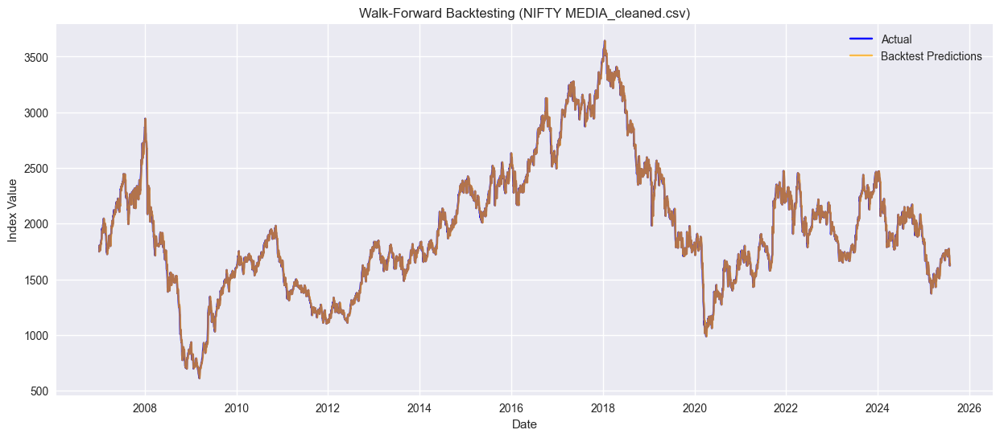

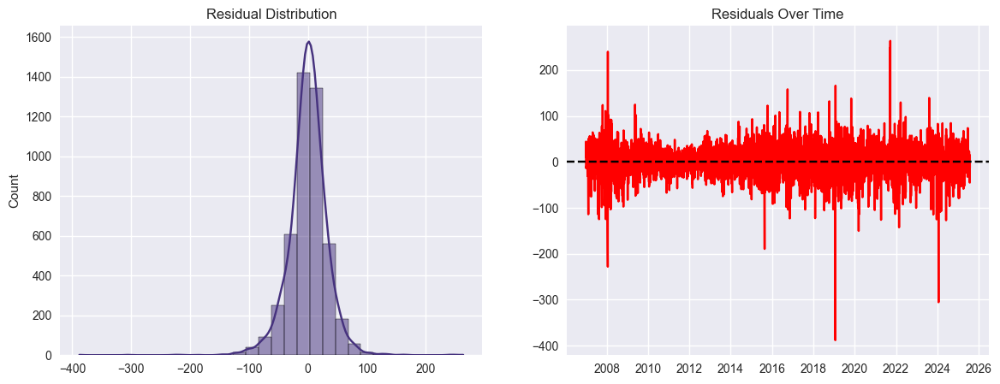

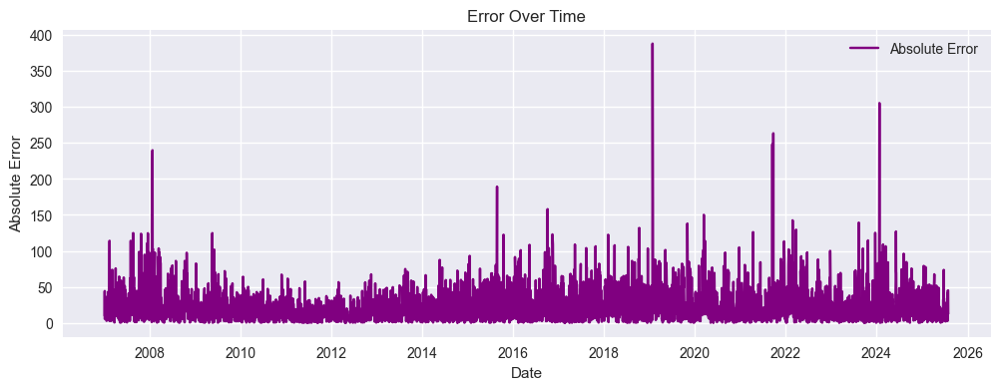

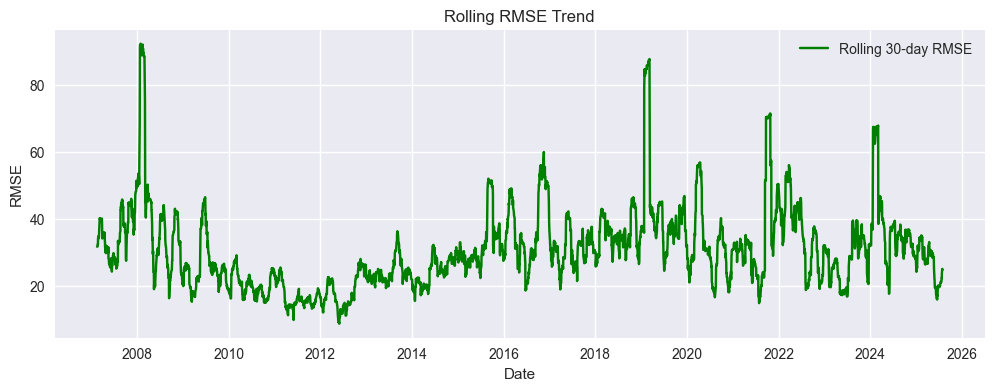


📂 Processing: NIFTY METAL_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (1, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [02:13<00:00, 34.50it/s]


📈 Metrics for NIFTY METAL_cleaned.csv
   RMSE: 79.1046
   MAE : 53.4165
   MAPE: 1.45%
   R²   : 0.9985


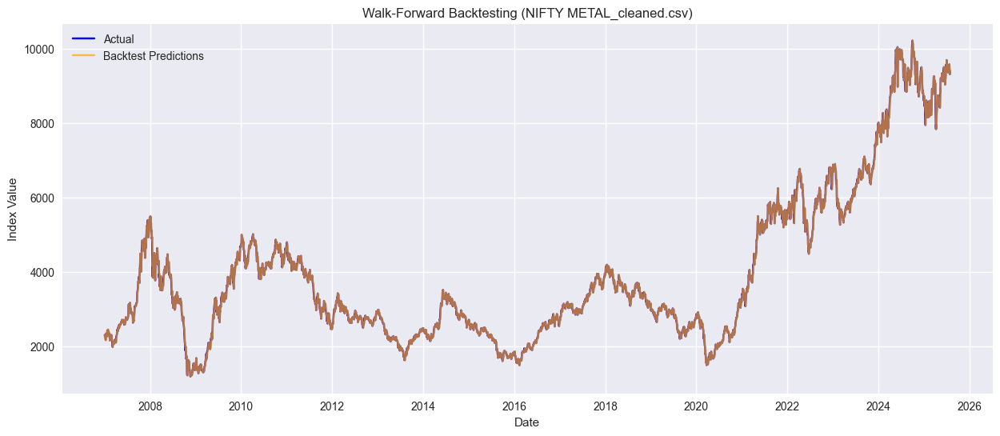

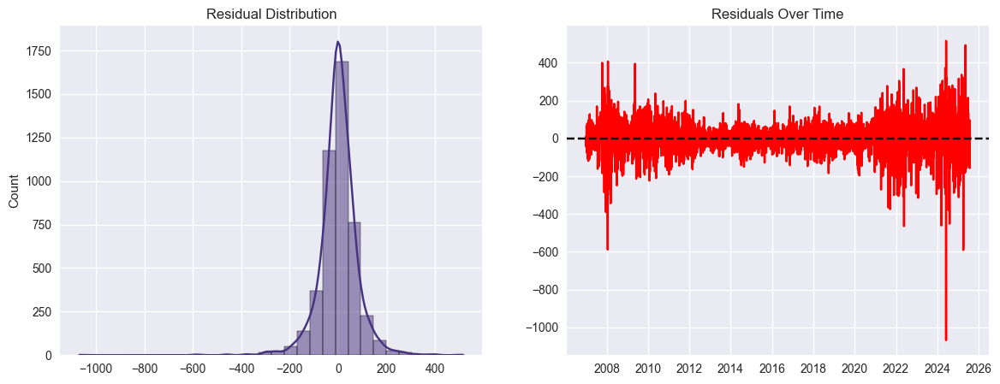

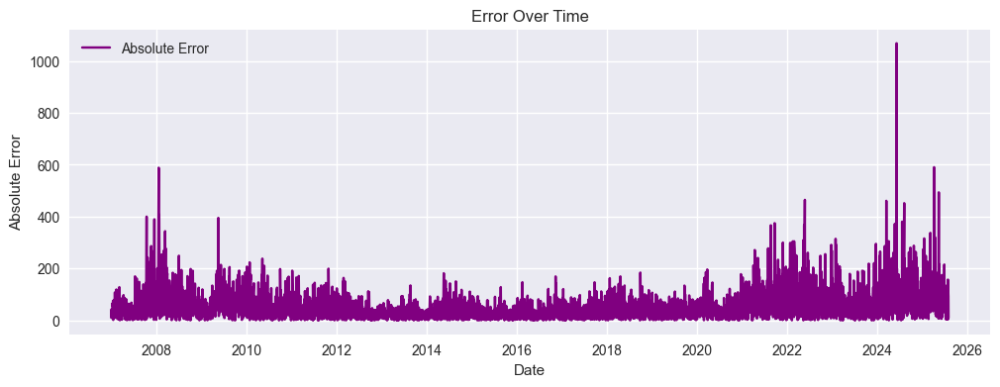

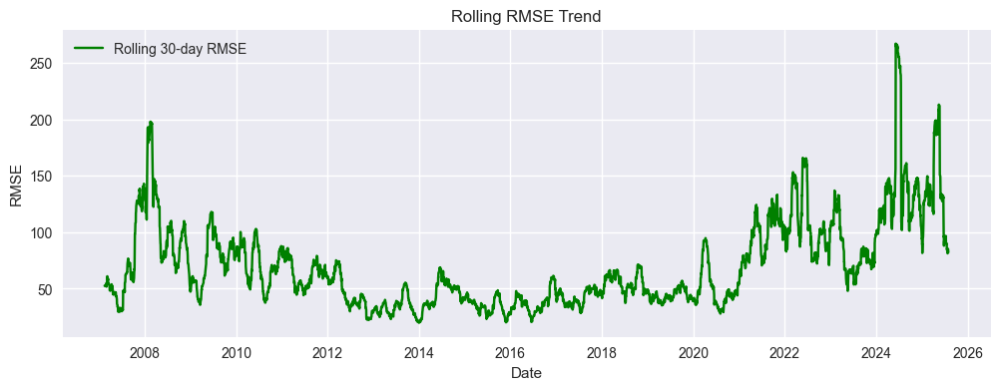


📂 Processing: NIFTY PHARMA_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (1, 1, 0)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [02:11<00:00, 34.91it/s]


📈 Metrics for NIFTY PHARMA_cleaned.csv
   RMSE: 119.6057
   MAE : 79.4917
   MAPE: 0.89%
   R²   : 0.9995


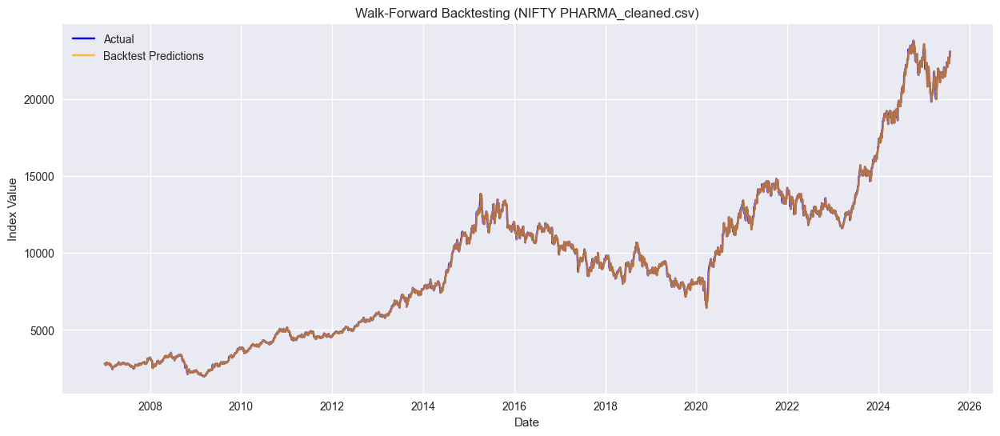

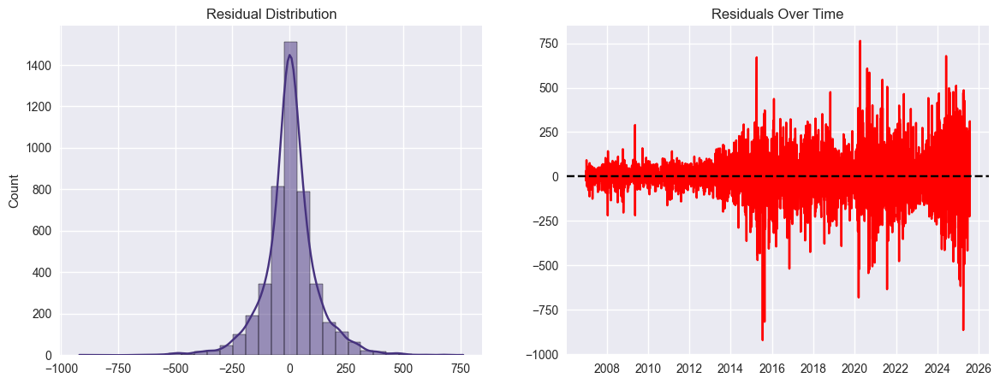

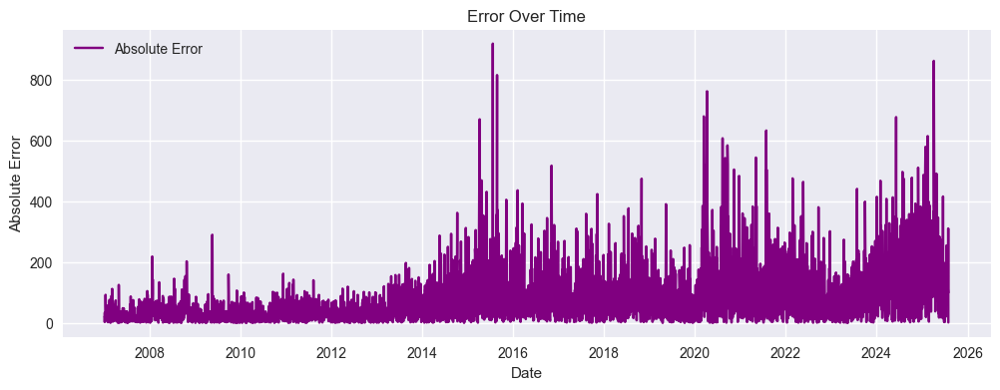

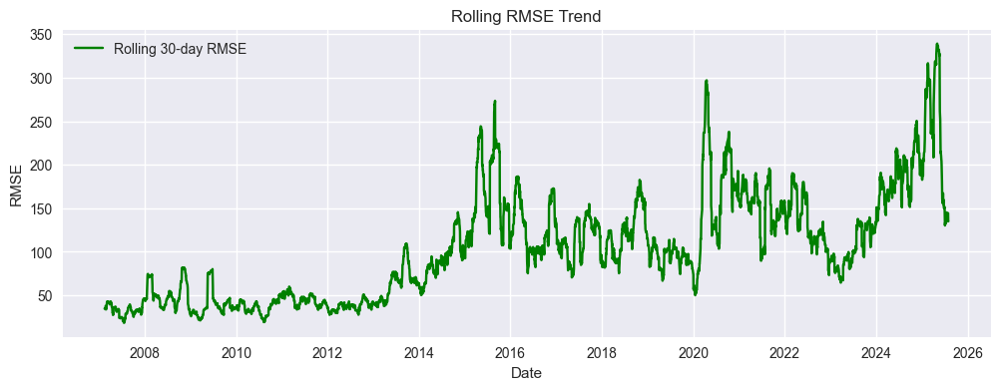


📂 Processing: NIFTY PRIVATE BANK_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (2, 1, 3)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [59:11<00:00,  1.30it/s]

📈 Metrics for NIFTY PRIVATE BANK_cleaned.csv
   RMSE: 170.9382
   MAE : 109.4431
   MAPE: 1.20%
   R²   : 0.9995


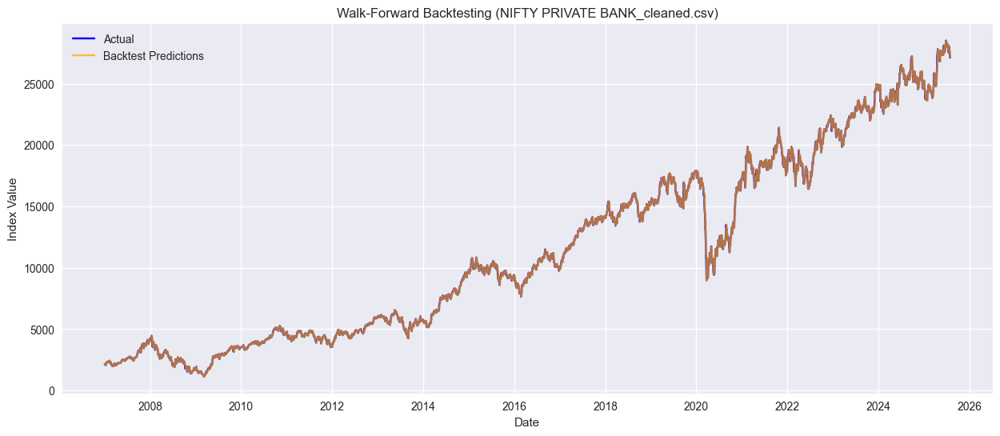

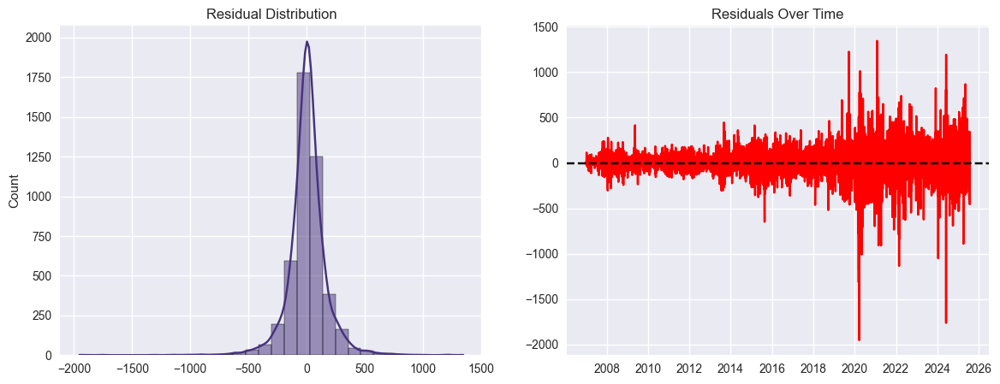

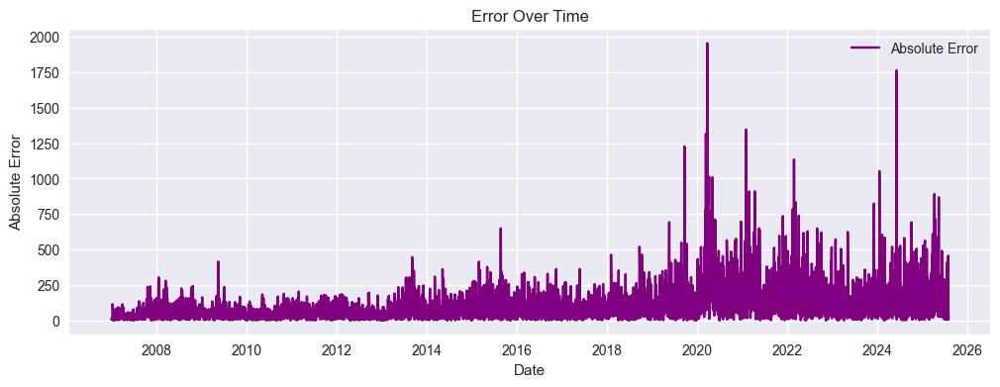

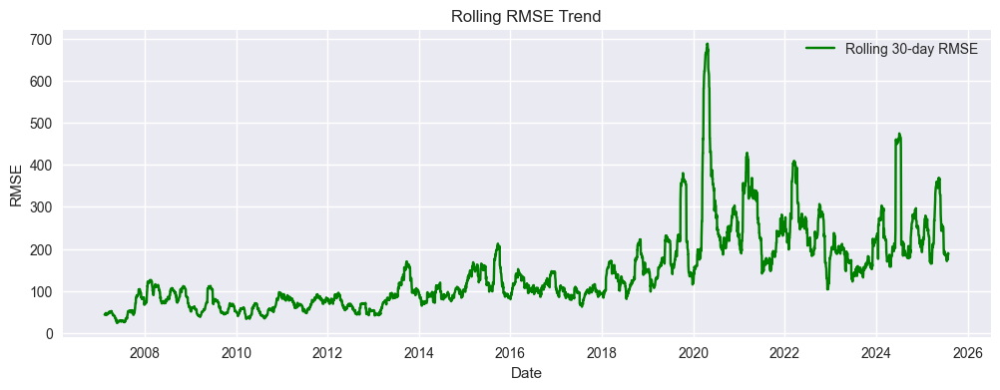


📂 Processing: NIFTY PSU BANK_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (0, 1, 1)


100%|██████████████████████████████████████████████████████████████████████████████| 4603/4603 [03:10<00:00, 24.12it/s]


📈 Metrics for NIFTY PSU BANK_cleaned.csv
   RMSE: 69.4263
   MAE : 48.3496
   MAPE: 1.56%
   R²   : 0.9973


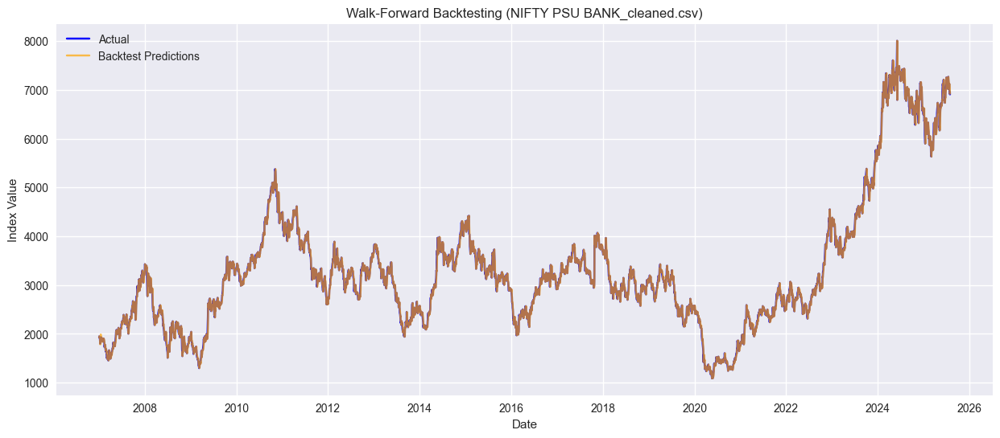

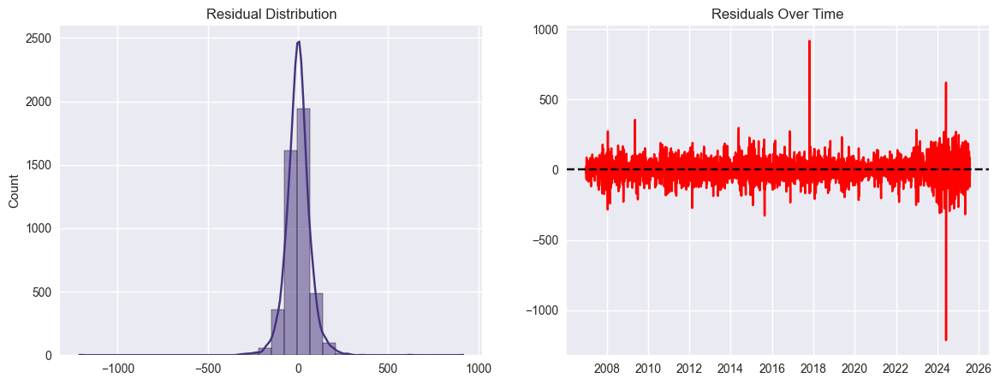

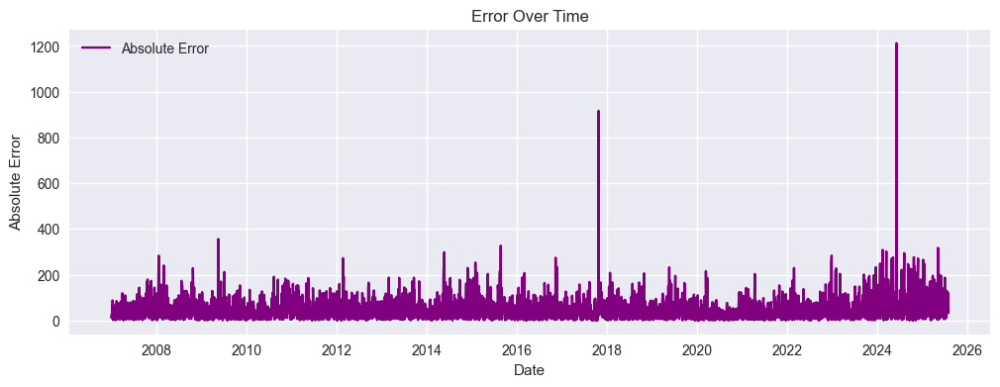

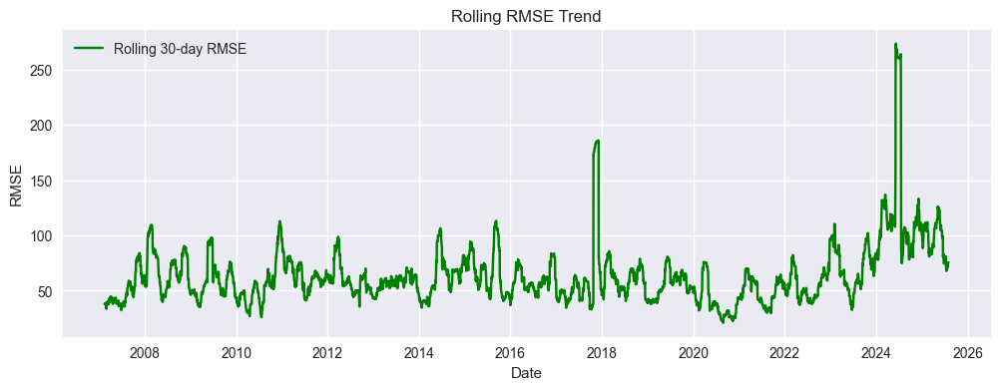


📂 Processing: NIFTY REALTY_cleaned.csv
🔍 Auto-tuning ARIMA order...
✅ Selected ARIMA order: (5, 1, 3)


100%|████████████████████████████████████████████████████████████████████████████| 4603/4603 [1:50:22<00:00,  1.44s/it]

📈 Metrics for NIFTY REALTY_cleaned.csv
   RMSE: 14.2341
   MAE : 7.7073
   MAPE: 1.74%
   R²   : 0.9978


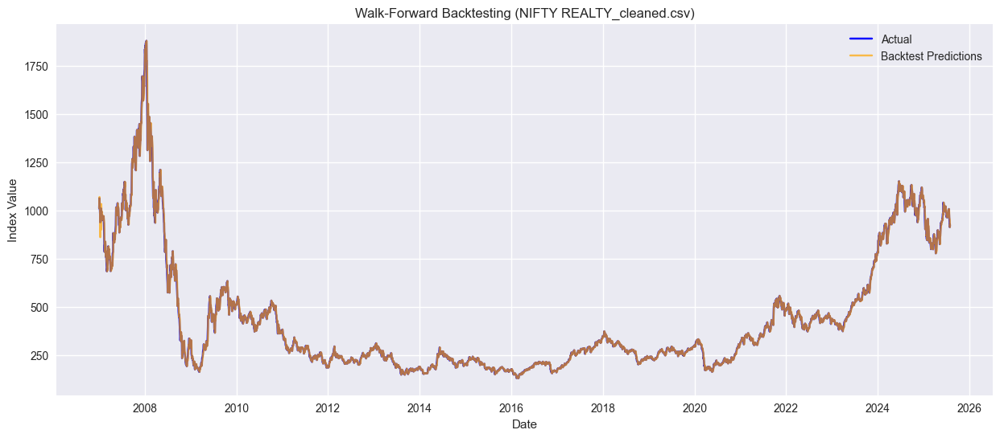

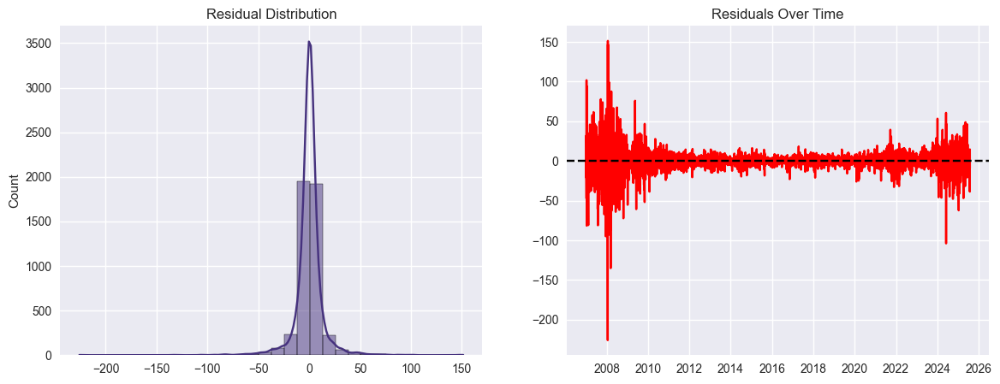

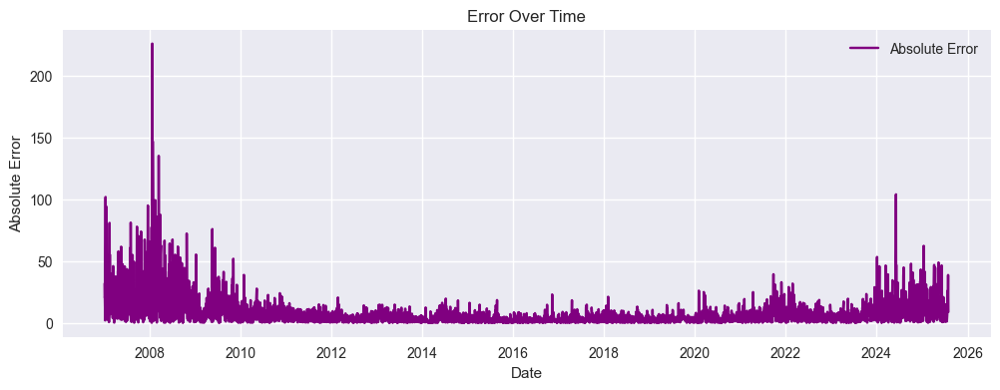

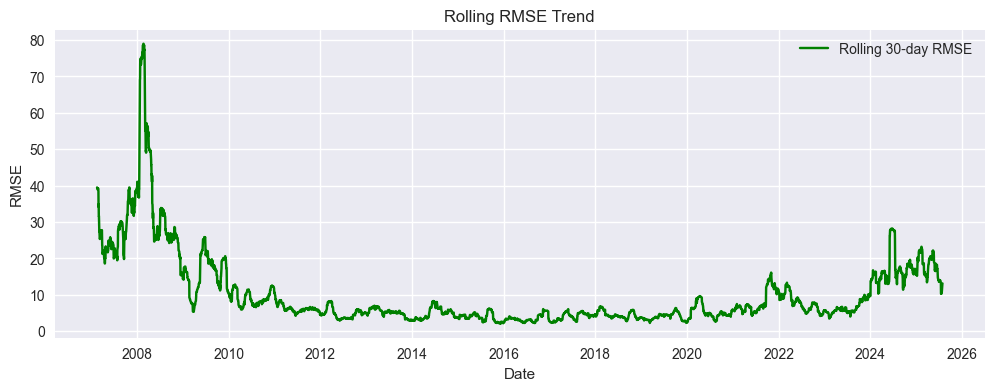

,file,rmse,mae,mape,r2
0,NIFTY 50_cleaned.csv,116.478734,77.417326,0.873078,0.999623
1,NIFTY AUTO_cleaned.csv,124.101576,77.956527,1.022966,0.999548
2,NIFTY BANK_cleaned.csv,327.615667,215.328589,1.189461,0.999460
3,NIFTY CHEMICALS_cleaned.csv,150.764297,80.912152,0.958682,0.999720
4,NIFTY CONSUMER DURABLES_cleaned.csv,190.998585,109.739271,1.018211,0.999703
5,NIFTY FINANCIAL SERVICES_cleaned.csv,144.395229,91.560718,1.143022,0.999530
6,NIFTY FMCG_cleaned.csv,276.234119,179.031075,0.823580,0.999696
7,NIFTY HEALTHCARE_cleaned.csv,1115.182876,798.927991,17.675054,0.848109
8,NIFTY IT_cleaned.csv,250.881780,148.110135,1.067177,0.999512
9,NIFTY MEDIA_cleaned.csv,33.007583,23.317873,1.249264,0.996612


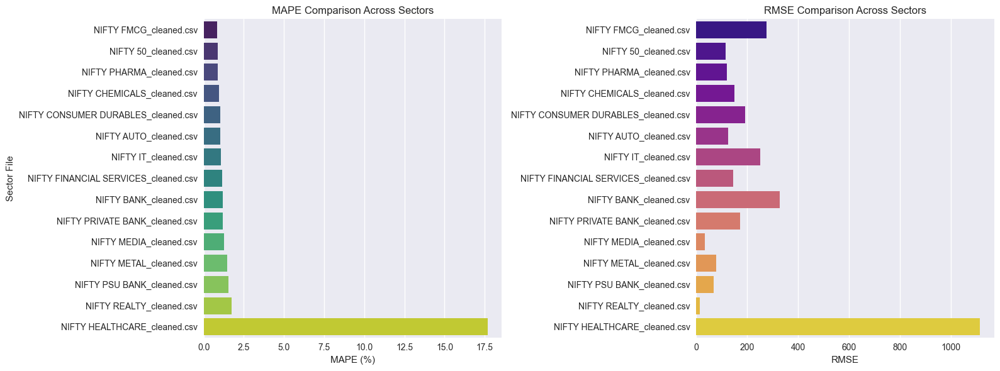

In [33]:
# 📌 Block C (Final): Run Backtesting for All Sectoral Files + Comparison Plot

# Point to your folder containing all 15 CSVs
file_list = glob.glob("C:/Users/ch.en.u4aie22004/Downloads/Indiansecs/*.csv")

results = []
for file in file_list:
    metrics = backtest_arima(file)
    results.append(metrics)

# Convert metrics to DataFrame
metrics_df = pd.DataFrame(results)
display(metrics_df)

# 📊 Comparison Bar Charts (MAPE + RMSE across all sectors)
fig, axes = plt.subplots(1, 2, figsize=(16,6))

# Sort by MAPE
metrics_df.sort_values("mape", inplace=True)

sns.barplot(x="mape", y="file", data=metrics_df, ax=axes[0], palette="viridis")
axes[0].set_title("MAPE Comparison Across Sectors")
axes[0].set_xlabel("MAPE (%)")
axes[0].set_ylabel("Sector File")

sns.barplot(x="rmse", y="file", data=metrics_df, ax=axes[1], palette="plasma")
axes[1].set_title("RMSE Comparison Across Sectors")
axes[1].set_xlabel("RMSE")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()


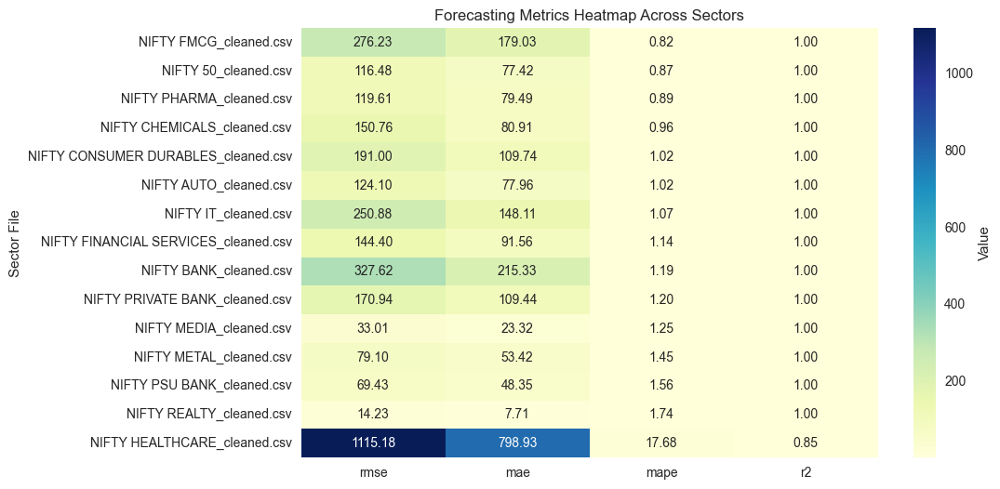

In [34]:
# 📌 Heatmap of Metrics
plt.figure(figsize=(10,6))
heatmap_data = metrics_df.set_index("file")[["rmse", "mae", "mape", "r2"]]
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={"label": "Value"})
plt.title("Forecasting Metrics Heatmap Across Sectors")
plt.ylabel("Sector File")
plt.show()